In [1]:
import numpy as np
from scipy.stats import t
import numpy as np
import scipy
from environments.medevac import MedevacDispatchingEnvironment, greedy_policy, random_policy
import pandas as pd
import matplotlib.pyplot as plt
from gymnasium.wrappers import FlattenObservation

In [2]:
env = MedevacDispatchingEnvironment(
    map_config_file="environments\\configuration\\afghanistan\\v2\\map.csv",
    MTF_config_file="environments\\configuration\\afghanistan\\v2\\MTFs.csv", 
    staging_area_config_file="environments\\configuration\\afghanistan\\v2\\staging_areas.csv",
    casualty_cluster_center_config_file="environments\\configuration\\afghanistan\\v2\\casualty_cluster_centers.csv",
    intensity_function_config_file="environments\\configuration\\afghanistan\\v2\\intensity_function_ranges_1.csv",
    num_zones=6,
    forecast_recency_bias=0.5,
    verbose=True
    )

state_dim = FlattenObservation(env).observation_space.shape[0]
print(f"State space dimensionality: {state_dim}")

n_actions = env.action_space.n
print(f"Number of actions: {n_actions}")

State space dimensionality: 236
Number of actions: 33


In [3]:
env.entities

{H1, H2, H3, H4, MTF1, MTF2, RM, SA1, SA2, SA3, SA4, Z1, Z2, Z3, Z4, Z5, Z6}

In [4]:
for index, decision in enumerate(env.decision_space):
    print(index, decision)

0 (H1, MTF1, SA1)
1 (H1, MTF1, SA2)
2 (H1, MTF1, SA3)
3 (H1, MTF1, SA4)
4 (H1, MTF2, SA1)
5 (H1, MTF2, SA2)
6 (H1, MTF2, SA3)
7 (H1, MTF2, SA4)
8 (H2, MTF1, SA1)
9 (H2, MTF1, SA2)
10 (H2, MTF1, SA3)
11 (H2, MTF1, SA4)
12 (H2, MTF2, SA1)
13 (H2, MTF2, SA2)
14 (H2, MTF2, SA3)
15 (H2, MTF2, SA4)
16 (H3, MTF1, SA1)
17 (H3, MTF1, SA2)
18 (H3, MTF1, SA3)
19 (H3, MTF1, SA4)
20 (H3, MTF2, SA1)
21 (H3, MTF2, SA2)
22 (H3, MTF2, SA3)
23 (H3, MTF2, SA4)
24 (H4, MTF1, SA1)
25 (H4, MTF1, SA2)
26 (H4, MTF1, SA3)
27 (H4, MTF1, SA4)
28 (H4, MTF2, SA1)
29 (H4, MTF2, SA2)
30 (H4, MTF2, SA3)
31 (H4, MTF2, SA4)
32 (None, None, None)


         0.0000 |       INFO |        Env | Max mean intensity:
                |            |            | 1.7484990900563735




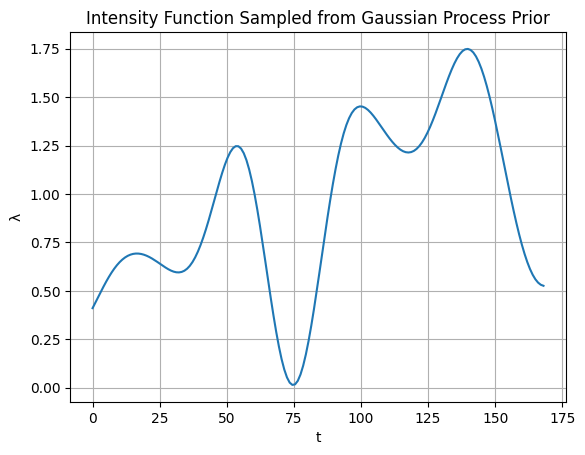

         0.0000 |       INFO |        Env | 355 total casualties generated


         0.0000 |       INFO |        Env | 240 total requests generated


         0.0000 |       INFO |        Env | 168 parent requests generated


         0.0000 |       INFO |        Env | 72 descendent requests generated




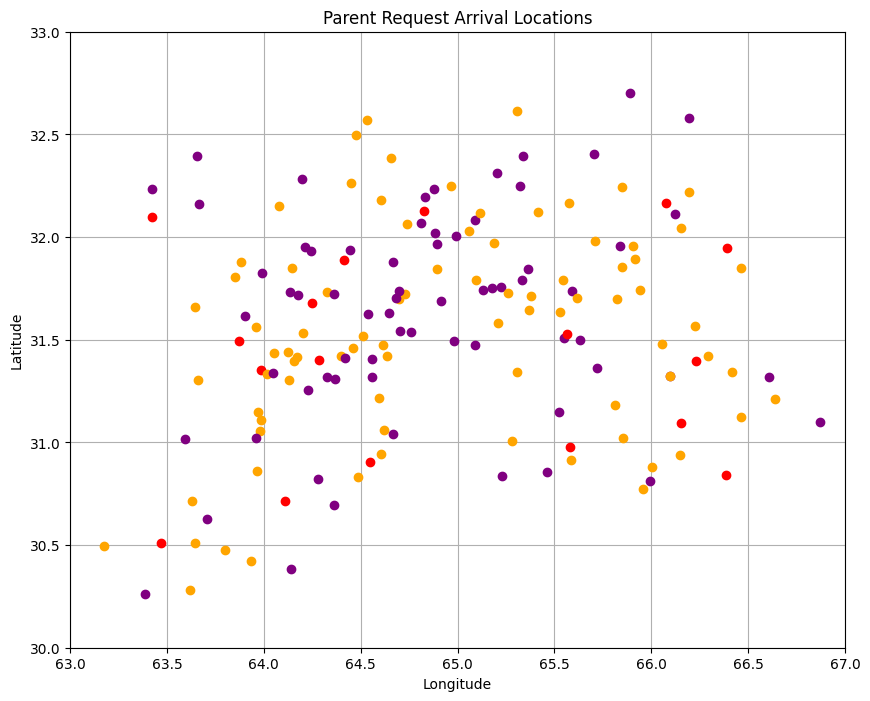

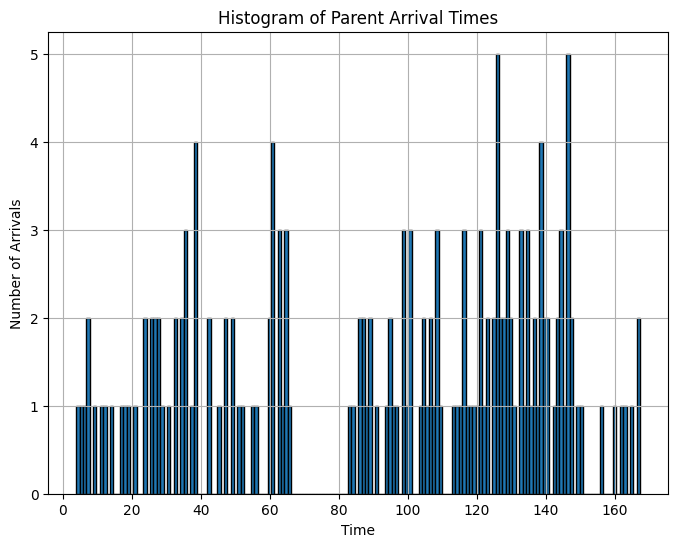

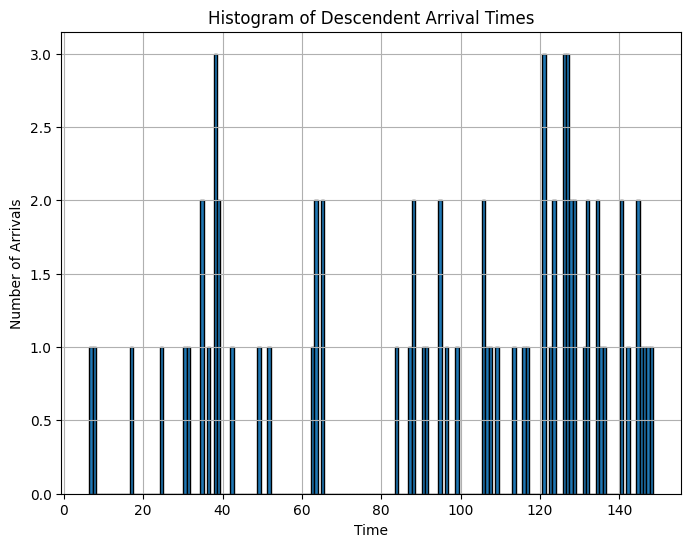

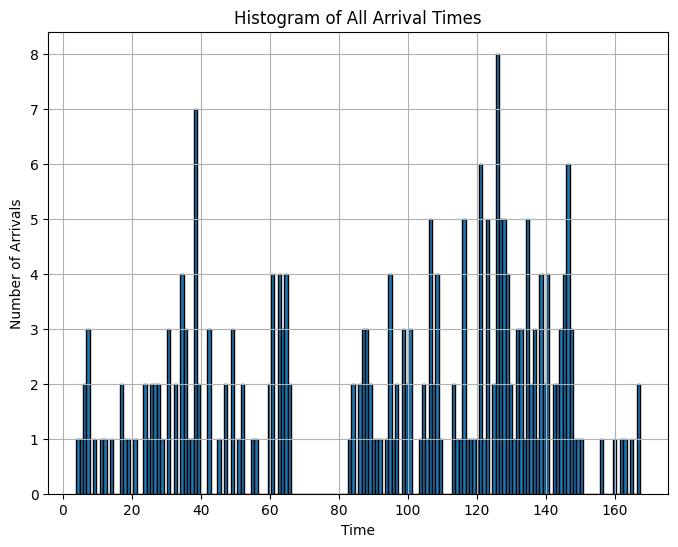

         3.9576 |       INFO |        Env | Processing event:
                |            |            | (Event.EventType.RECEIVED_REQUEST,
                |            |            | handler=RM, time=3.9575978716918754)


         3.9576 |       INFO |         Z5 | Observed interarrival time for
                |            |            | Precedence.ROUTINE requests:
                |            |            | 3.9575978716918754


         3.9576 |       INFO |         RM | R1 added to requests to examine:
                |            |            | [R1]


         3.9576 |       INFO |        Env | Processed event:
                |            |            | (Event.EventType.RECEIVED_REQUEST,
                |            |            | handler=RM, time=3.9575978716918754)


         3.9576 |       INFO |        Env | Updating state


         3.9576 |       INFO |        Env | State updated


==================== Requests ====================

 id  arrival_time precedence  deadline 

In [5]:
state, info = env.reset()
print(f"Num casualties: {env.num_casualties_generated}")
print(f"Total requests: {env.total_num_requests_generated}")
print(f"Parent requests: {env.num_parent_requests_generated}")
print(f"Descendent requests: {env.num_descendent_requests_generated}")
total_reward = 0
terminated = False
while not terminated:
        # decision = greedy_policy(state, info)
        decision = random_policy(state, info, np.random.default_rng())
        state, reward, terminated, truncated, info = env.step(decision)  
        total_reward += reward
print(f"Total reward: {total_reward}")
print(f"Num steps: {env.num_steps}")

In [6]:
env.future_events.events

[(Event.EventType.ARRIVED_AT_PICKUP_SITE, handler=H3, time=168.25081117635827),
 (Event.EventType.COMPLETED_PATIENT_TREATMENT, handler=MTF2, time=170.04807347796532),
 (Event.EventType.COMPLETED_PATIENT_TREATMENT, handler=MTF1, time=169.39851745662182),
 (Event.EventType.COMPLETED_PATIENT_TREATMENT, handler=MTF1, time=170.7041419343657),
 (Event.EventType.COMPLETED_PATIENT_TREATMENT, handler=MTF1, time=194.09116076149076),
 (Event.EventType.COMPLETED_PATIENT_TREATMENT, handler=MTF1, time=204.45375157908495),
 (Event.EventType.COMPLETED_PATIENT_TREATMENT, handler=MTF2, time=173.34692091563886),
 (Event.EventType.COMPLETED_PATIENT_TREATMENT, handler=MTF1, time=191.69035719242297),
 (Event.EventType.COMPLETED_PATIENT_TREATMENT, handler=MTF1, time=177.41410850442),
 (Event.EventType.COMPLETED_PATIENT_TREATMENT, handler=MTF1, time=195.0585709424513),
 (Event.EventType.COMPLETED_PATIENT_TREATMENT, handler=MTF1, time=221.7748589380538),
 (Event.EventType.COMPLETED_PATIENT_TREATMENT, handler=M

In [7]:
def get_service_metrics_df(metrics):
    data = []
    # Flatten the metrics into rows
    for mtf, precedences in metrics["avg_service_times"].items():
        for precedence in precedences.keys():
            data.append({
                "MTF": mtf,
                "Precedence": precedence.to_string(),
                "avg_service_times": metrics["avg_service_times"][mtf][precedence],
                "total_num_requests_serviced": metrics["total_num_requests_serviced"][mtf][precedence],
                "num_requests_serviced_on_time": metrics["num_requests_serviced_on_time"][mtf][precedence],
                "percent_requests_serviced_on_time": metrics["percent_requests_serviced_on_time"][mtf][precedence],
            })
    return pd.DataFrame(data)

In [8]:
print("Overall Service Metrics")
get_service_metrics_df(env.request_manager.get_service_metrics())

Overall Service Metrics


,MTF,Precedence,avg_service_times,total_num_requests_serviced,num_requests_serviced_on_time,percent_requests_serviced_on_time
0,MTF1,Urgent,5.706334,49,5,10.204082
1,MTF1,Priority,1.388120,24,24,100.000000
2,MTF1,Routine,1.678247,17,17,100.000000
3,MTF2,Urgent,0.000000,0,0,0.000000
4,MTF2,Priority,1.636243,81,81,100.000000
5,MTF2,Routine,2.212715,51,51,100.000000


In [9]:
print("Service Metrics by Zone")
for zone in env.zones:
    print(f"Zone: {zone}")
    print(get_service_metrics_df(zone.get_service_metrics()))
    print()

Service Metrics by Zone
Zone: Z1
    MTF Precedence  avg_service_times  total_num_requests_serviced  \
0  MTF1     Urgent           4.328989                           15   
1  MTF1   Priority           1.754477                            4   
2  MTF1    Routine           0.906720                            1   
3  MTF2     Urgent           0.000000                            0   
4  MTF2   Priority           1.761422                           14   
5  MTF2    Routine           4.311032                            7   

   num_requests_serviced_on_time  percent_requests_serviced_on_time  
0                              0                                0.0  
1                              4                              100.0  
2                              1                              100.0  
3                              0                                0.0  
4                             14                              100.0  
5                              7                        

In [10]:
print("Staging Area Metrics")
data = []
for staging_area in env.staging_areas:
    metrics = staging_area.get_service_metrics()
    data.append({"Staging Area": staging_area, "num_helicopters_serviced": metrics["num_helicopters_serviced"]})
pd.DataFrame(data)
    

Staging Area Metrics


,Staging Area,num_helicopters_serviced
0,SA1,35
1,SA2,70
2,SA3,36
3,SA4,39
